# <center>EDA</center>
<div style="text-align:center">
    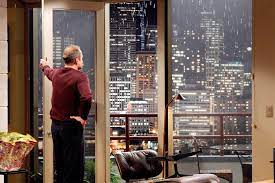
</div>

# Adapting the data set in DBEAVER

Using the following commands in DBeaver to get the data/merge tables:
```
SET SCHEMA 'eda';
SELECT k1.*, k2.date, k2.price
FROM king_county_house_details k1
INNER JOIN king_county_house_sales k2
ON k1.id = k2.house_id; 
```

The file is saved in data/king_county_house_details_sales.csv


# Libraries to import

In [3]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import PercentFormatter

# Library to visualize the missing the data
import missingno as msno

# Plot to identify poor neighborhoods
import altair as alt
import json
# Reprojecting geometrical data to adapt the coordinate system
import geopandas as gpd

# from vega_datasets import data as vega_data

import plotly.express as px
import plotly.graph_objects as go

# Normalizing data
from sklearn import preprocessing

# To calculate geo distances
from geopy.distance import geodesic


# Import data set

Importing the merged data_set from a csv file. Which has already two joined tables to include price and it's date

In [4]:
df_kch = pd.read_csv('data/king_county_housing_details_a_sales.csv')

In [109]:
# Get info about the database: number of non null rows and data types
print(df_kch.info())
# Dimension of the dataset
print("Shape of the dataset:",np.shape(df_kch))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

Notes: 
- Waterfront, view, yr_renovated has some missing values
- Grade and Condition is in int
- Date is a string

In [5]:
# # Convert yr_renovated to int
# # Define a custom function to handle conversion
def convert_yr_renovated(value):
    if isinstance(value, (int, float)) and not np.isnan(value):
        return int(value / 10)
    return value

# Apply the custom function to yr_renovated column
df_kch['yr_renovated'] = df_kch['yr_renovated'].apply(convert_yr_renovated)

# # Display the data types of yr_renovated column
# unique_values = df_kch['yr_renovated'].unique()
# print(unique_values)
# print(df_kch['yr_renovated'][0].dtype)

In [5]:
print(df_kch['yr_renovated'][0])
df_kch.head(5)

0.0


,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3.0,1.00,1180.0,5650.0,1.0,NaN,0.0,3,7,...,0.0,1955,0.0,98178,47.5112,-122.257,1340.0,5650.0,2014-10-13,221900.0
1,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690.0,7639.0,2014-12-09,538000.0
2,5631500400,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3,6,...,0.0,1933,NaN,98028,47.7379,-122.233,2720.0,8062.0,2015-02-25,180000.0
3,2487200875,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5,7,...,910.0,1965,0.0,98136,47.5208,-122.393,1360.0,5000.0,2014-12-09,604000.0
4,1954400510,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3,8,...,0.0,1987,0.0,98074,47.6168,-122.045,1800.0,7503.0,2015-02-18,510000.0


Converting the type of the date:

In [6]:
# converting the data type of date to date
df_kch['date'] = pd.to_datetime(df_kch['date'], format='%Y-%m-%d')

# Investigating simple statistics for columns & nan values & duplicates

In [11]:
# Basic statistics analysis of the columns:
print(df_kch.describe())

                 id      bedrooms     bathrooms   sqft_living      sqft_lot  \
count  2.159700e+04  21597.000000  21597.000000  21597.000000  2.159700e+04   
mean   4.580474e+09      3.373200      2.115826   2080.321850  1.509941e+04   
std    2.876736e+09      0.926299      0.768984    918.106125  4.141264e+04   
min    1.000102e+06      1.000000      0.500000    370.000000  5.200000e+02   
25%    2.123049e+09      3.000000      1.750000   1430.000000  5.040000e+03   
50%    3.904930e+09      3.000000      2.250000   1910.000000  7.618000e+03   
75%    7.308900e+09      4.000000      2.500000   2550.000000  1.068500e+04   
max    9.900000e+09     33.000000      8.000000  13540.000000  1.651359e+06   

             floors    waterfront          view     condition         grade  \
count  21597.000000  19206.000000  21534.000000  21597.000000  21597.000000   
mean       1.494096      0.007602      0.233863      3.409825      7.657915   
std        0.539683      0.086858      0.765686    

Compared to Berlin: 
 - the sqft of living is 5 times 
 - waterfront, view, yr_renovated, sqft-basement show uncammon values for 25%,50%,min .... 

In [12]:
print("Unique values for the waterfront:",df_kch["waterfront"].unique())
print("Unique values for the year renovated:",df_kch["yr_renovated"].unique())
print("Unique values for the condition:",df_kch["condition"].min(),"-",df_kch["condition"].max())
print("Unique values for the grade:",df_kch["grade"].min(),"-",df_kch["grade"].max())

Unique values for the waterfront: [nan  0.  1.]
Unique values for the year renovated: [  0. 199.  nan 200. 201. 197. 198. 195. 194. 196. 193.]
Unique values for the condition: 1 - 5
Unique values for the grade: 3 - 13


<Axes: >

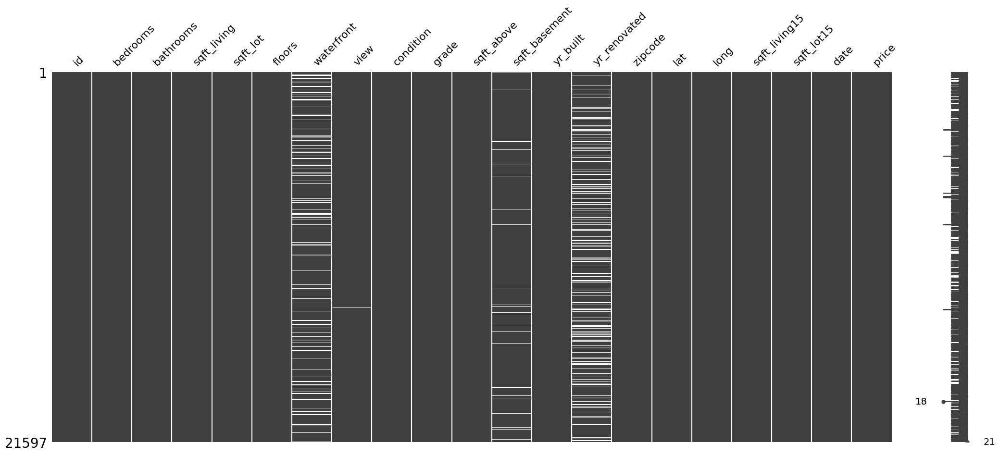

In [9]:
msno.matrix(df_kch)

Notes: waterfront,view, sqft_basement,yr_renovated has missing values

Basic statistical analysis of the columns:

In [13]:
# check how many duplicated rows exist in the data frame
df_kch.duplicated().value_counts()

False    21597
dtype: int64

In [14]:
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Investigating outliers

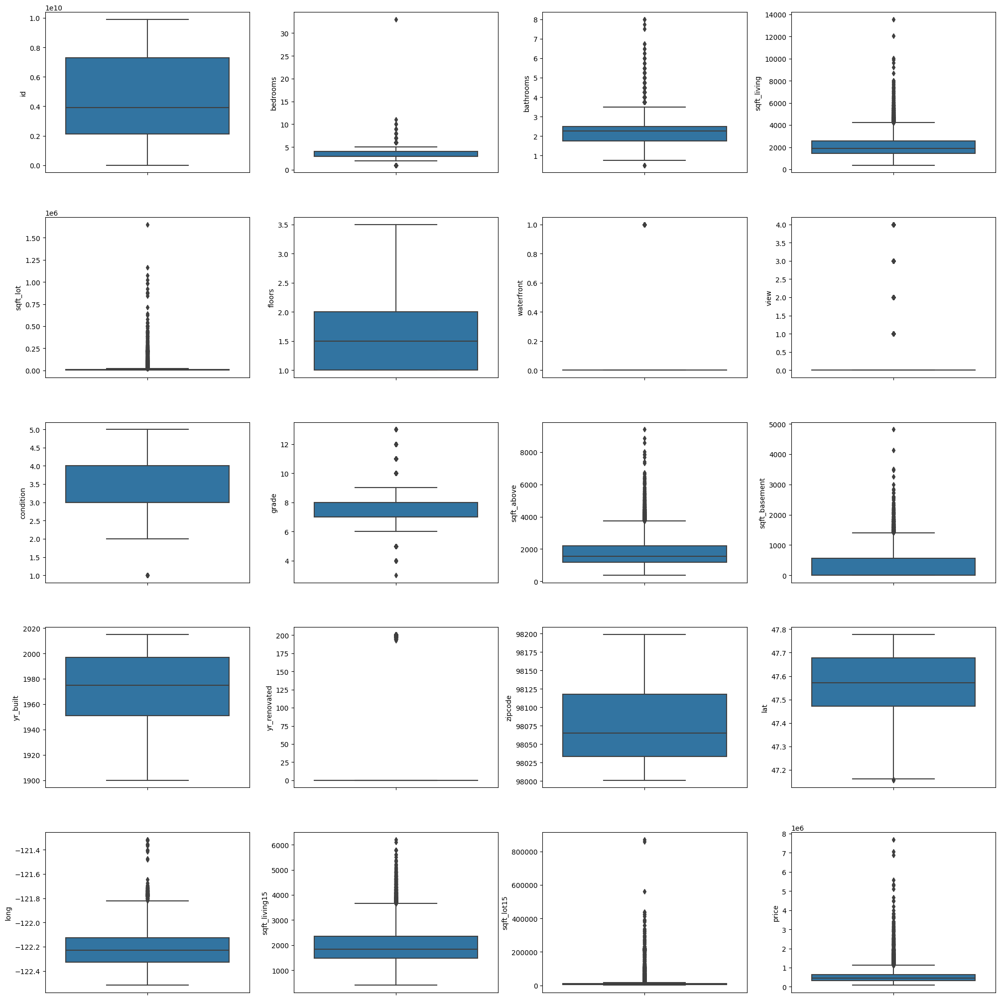

In [15]:
fig, axs = plt.subplots(ncols=4, nrows=5, figsize=(20,20))
index = 0
axs = axs.flatten()
for k,v in df_kch.items():
    if k!="date":
        sns.boxplot(y=k, data=df_kch, ax=axs[index])
        index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
# Checking the outliers via Google Earth(David's Idea)

max_bedrooms_row = df_kch.loc[df_kch['bedrooms'].idxmax()] # 33 bedrooms are not possible, typo, living area 162m^2 => 0,2m^2 per room?
max_bathrooms_row = df_kch.loc[df_kch['bathrooms'].idxmax()] #  ok
max_sqft_living = df_kch.loc[df_kch['sqft_living'].idxmax()] # ok
max_sqft_lot = df_kch.loc[df_kch['sqft_lot'].idxmax()] # ok
max_view = df_kch.loc[df_kch['view'].idxmax()] # nice
max_basement = df_kch.loc[df_kch['sqft_basement'].idxmax()] # cana? production
min_yr_build = df_kch.loc[df_kch['yr_built'].idxmin()] # the 1900 houses doesnt look old, maybe they didn't change the intial value
last_ten_min_yr_build = df_kch.nsmallest(10, 'yr_built')
max_price_row = df_kch.loc[df_kch['price'].idxmax()] # 
min_grade_row = df_kch.loc[df_kch['grade'].idxmin()] # 

min_grade_row

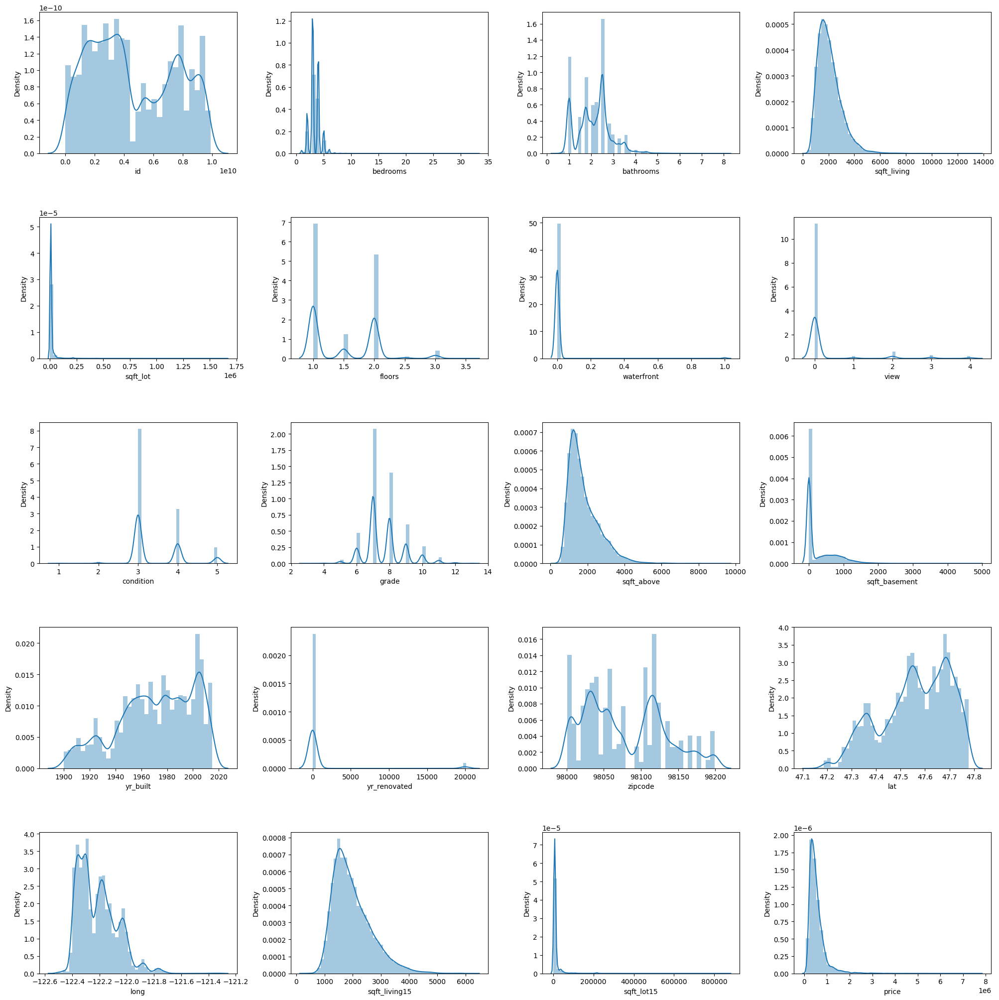

In [6]:
# Distributions - helpful to know where to trim the data
fig, axs = plt.subplots(ncols=4, nrows=5, figsize=(20, 20))
index = 0
axs = axs.flatten()
for k,v in df_kch.items():
    if k!="date":
        sns.distplot(v, ax=axs[index])
        index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

<Axes: >

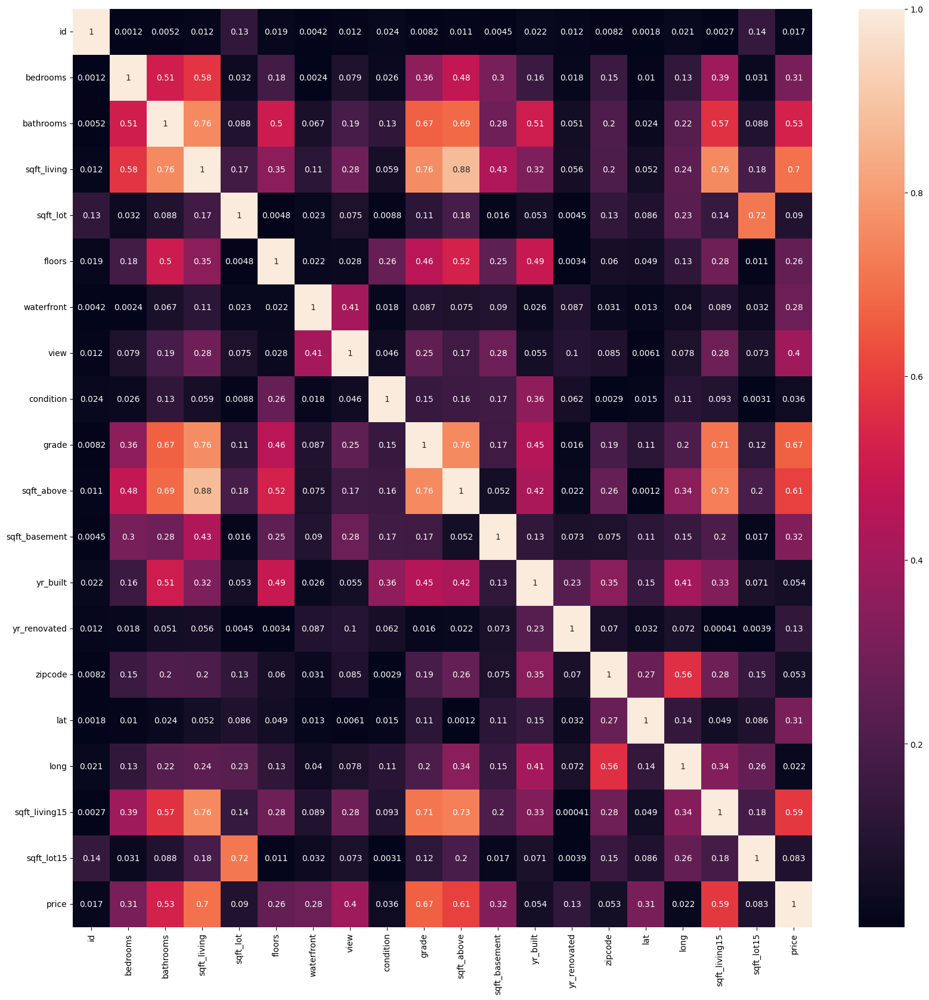

In [7]:
# Corr Matrix  - living space and grade shows high correlation with price - plot again after cleaning
plt.figure(figsize=(20, 20))
sns.heatmap(df_kch.corr().abs(),  annot=True)

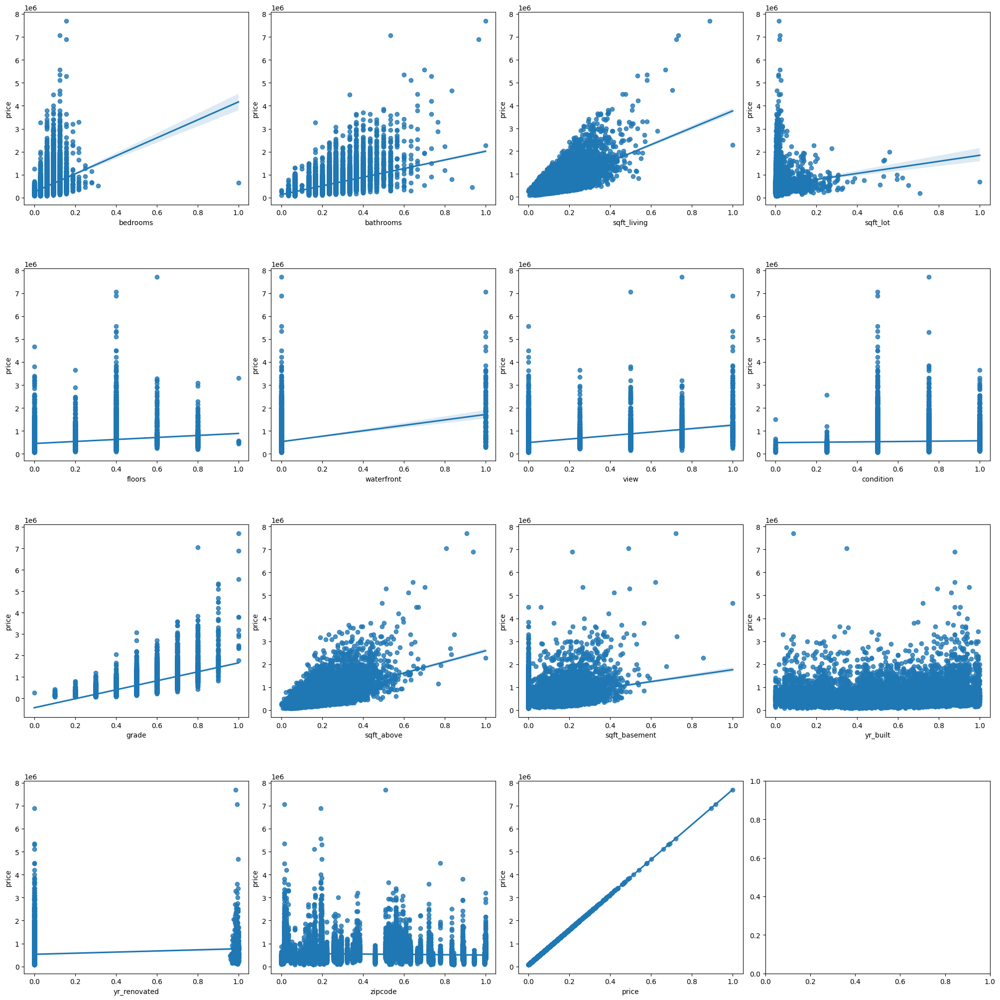

In [6]:
# Regression plot
# Scaling the columns 
min_max_scaler = preprocessing.MinMaxScaler()
columns = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade','sqft_above', 'sqft_basement', 'yr_built','yr_renovated','zipcode', 'price']
x = df_kch.loc[:,columns]
y = df_kch['price']
x = pd.DataFrame(data=min_max_scaler.fit_transform(x), columns=columns)
fig, axs = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
index = 0
axs = axs.flatten()
for i, k in enumerate(columns):
    if i!="date":
        sns.regplot(y=y, x=x[k], ax=axs[i])
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


Ideas to fill the parameters:
- yr_built:based on price and grade / neighbaring bilding estimate it's year
- yr_renovated: also based on built year and price and location estimate price / based on $/m^2 estimate renovation year

For now:
- remove all suspicious data 
- then try to improve your estimation

In [13]:
# Percentage of outliers
for key, value in df_kch.items():
    # q1 and q3: lower and upper quartiles
    q1 = value.quantile(0.25)
    q3 = value.quantile(0.75)
    # interuartile range
    ir = q3 - q1
    # only outliers
    v_col = value[(value <= q1 - 1.5 * ir) | (value >= q3 + 1.5 * ir)]
    # percentage of outliers, but waterfront,view, sqft_basement,yr_renovated has still missing values
    perc = np.shape(v_col)[0] * 100.0 / np.shape(df_kch)[0]
    print("Column %s outliers = %.2f%%" % (key, perc))

Column id outliers = 0.00%
Column bedrooms outliers = 2.45%
Column bathrooms outliers = 2.60%
Column sqft_living outliers = 2.69%
Column sqft_lot outliers = 11.20%
Column floors outliers = 0.03%
Column waterfront outliers = 88.93%
Column view outliers = 99.71%
Column condition outliers = 0.13%
Column grade outliers = 8.82%
Column sqft_above outliers = 2.86%
Column sqft_basement outliers = 2.42%
Column yr_built outliers = 0.00%
Column yr_renovated outliers = 82.18%
Column zipcode outliers = 0.00%
Column lat outliers = 0.01%
Column long outliers = 1.18%
Column sqft_living15 outliers = 2.51%
Column sqft_lot15 outliers = 10.13%
Column date outliers = 0.00%
Column price outliers = 5.36%


# Customer Profile
Erin Robinson:
- Buyer, 
- Invest in poor neighborhood, 
- buying & selling, 
- costs back + little profit, 
- socially responsible  
- wants to help families
- biggest impact on the community


Steps:
1. Clean / Fill data
    - first iteration removing data
    - second iteration filling data
2. Identifying poor neighborhoods
    - using the house grading system 1-13 of King County - (Choosing 4-7)
    - condition 1-2
    - bedrooms > 3
3. Estimate gains per house

For now removing outliers for:
- bedrooms and bathrooms, there for my client -> poor neighbourhoods
- sqft living, also not important -> social impact
- grade and condition outliers, bc not worth investing -> have to back up this data with price, number of rooms -=> 
- will be filtered during selection bedrooms > 3 -> wants to help families
- 

# 1. Cleaning the data set

Evelation of trimming method for each parameter:
1. id
2. bedrooms 
    - Q1-1.5Interquartile Range - Q3+1.5IQR - Min&Max reasoning: 
        - <3 small families
        - 5> expensive houses? have to check the data - Correlation between bedrooms and price 
3. bathrooms:
    - Min&Max reasoning:
        - <1 you need at least 1 :)
        - >3 rich people -> Look at price and bathroom correlation
4. sqft_living:
    - Min&Max reasoning: Price / Social Impact 
5. sqft_lot
    - same as living
6. floors
    - <=2 reason: price?
7. waterfront
    - leave it
8. view
    - leave it alone :)
9. condition
    - >=3   
10. grade
    - 6-7
11. sqft_basement
12.	yr_built
    - get rid of 1900: because wrong input
13.	yr_renovated
    - get rid of 0, but good estimation is needed
    - because there are lot's houses missing this value
    - and important to calculate possible gains
14.	zipcode	
15. lat
16.	long
17.	sqft_living15
    - Min&Max
18.	sqft_lot15
    - Min&Max
19.	date
20.	price 
    - Min&Max: overbudget / profit margin


In [7]:
def remove_outliers_iqr(df, columns):
    """
    Remove outliers from specified columns of a DataFrame using IQR.
    
    Args:
    df (pd.DataFrame): The DataFrame containing the columns.
    columns (list): List of column names to remove outliers from.
    
    Returns:
    pd.DataFrame: DataFrame with outliers removed from specified columns.
    """
    filtered_rows = []
    
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        filtered_rows.append((df[col] >= lower_bound) & (df[col] <= upper_bound))
    
    final_filter = pd.Series([True] * len(df))
    
    for col_filter in filtered_rows:
        final_filter &= col_filter
    
    filtered_df = df[final_filter]
    return filtered_df

In [8]:
def remove_rows_by_condition(df, column, condition, value, remove_nan=False):
    """
    Remove rows from a DataFrame based on a specified condition and value in a column.
    
    Args:
    df (pd.DataFrame): The DataFrame to remove rows from.
    column (str): Name of the column to apply the condition on.
    condition (str): Condition for comparison, one of: "lessequal", "moreequal", "equal".
    value: Value to use in the comparison.
    
    Returns:
    pd.DataFrame: DataFrame with rows removed based on the specified condition.
    """
    if remove_nan:
        df = df.dropna(subset=[column])

    if condition == "more":
        filtered_df = df[df[column] <= value]
    elif condition == "less":
        filtered_df = df[df[column] >= value]
    elif condition == "equal":
        filtered_df = df[df[column] != value]
    else:
        raise ValueError("Invalid condition. Use 'less', 'more', or 'equal'.")
    
    return filtered_df

In [9]:
print(df_kch.shape)
columns_to_remove_outliers = ['bedrooms', 'bathrooms','sqft_living','sqft_lot','sqft_living15','sqft_lot15']  # Add columns you want to filter
filtered_df = remove_outliers_iqr(df_kch, columns_to_remove_outliers)
print(filtered_df.shape)

(21597, 21)
(17852, 21)


In [10]:
# Example usage
column_to_filter = 'floors'  # Replace with your column name
condition_to_apply = 'more'  # Replace with your condition
value_to_compare = 3  # Replace with your value

filtered_df = remove_rows_by_condition(filtered_df, column_to_filter, condition_to_apply, value_to_compare)
print(filtered_df.shape)

(17846, 21)


In [11]:
# Example usage
column_to_filter = 'condition'  # Replace with your column name
condition_to_apply = 'less'  # Replace with your condition
value_to_compare = 2  # Replace with your value

filtered_df = remove_rows_by_condition(filtered_df, column_to_filter, condition_to_apply, value_to_compare)
print(filtered_df.shape)

(17829, 21)


In [12]:
# Example usage
column_to_filter = 'grade'  # Replace with your column name
condition_to_apply = 'more'  # Replace with your condition
value_to_compare = 8  # Replace with your value

filtered_df = remove_rows_by_condition(filtered_df, column_to_filter, condition_to_apply, value_to_compare)
print(filtered_df.shape)

(15276, 21)


In [13]:
# Example usage
column_to_filter = 'yr_built'  # Replace with your column name
condition_to_apply = 'equal'  # Replace with your condition
value_to_compare = 1900  # Replace with your value

filtered_df = remove_rows_by_condition(filtered_df, column_to_filter, condition_to_apply, value_to_compare)
print(filtered_df.shape)

(15208, 21)


In [14]:
# Example usage
column_to_filter = 'yr_renovated'  # Replace with your column name
condition_to_apply = 'equal'  # Replace with your condition
value_to_compare = 0  # Replace with your value

filtered_df_ren = remove_rows_by_condition(filtered_df, column_to_filter, condition_to_apply, value_to_compare,remove_nan=True)
print(filtered_df_ren.shape)

(438, 21)


If we remove nan values of the yr_renovated column, out data set shrinks to ~400

# 2. Identifying poor neighborhoods

Idea: 
- Price per sqft as an indicator of status of the community
- Looking for an area with the lowest pps and the highest difference to its neighbours

In [15]:
filtered_df_ren['price_per_sqft'] = filtered_df_ren['price'] / filtered_df_ren['sqft_living']

In [16]:
filtered_df_ren.head(1)
# filtered_df_ren.shape

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,price_per_sqft
1,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,...,1951,1991.0,98125,47.721,-122.319,1690.0,7639.0,2014-12-09,538000.0,209.338521


In [17]:
# Set initial center coordinates and zoom level
initial_center = {"lat": filtered_df_ren["lat"].mean(), "lon": filtered_df_ren["long"].mean()}
initial_zoom = 10  # Adjust the zoom level as needed

# Define the grid dimensions (number of bins)
num_bins_x = 200
num_bins_y = 200


# Calculate bin edges
x_edges = np.linspace(filtered_df_ren["long"].min(), filtered_df_ren["long"].max(), num_bins_x + 1)
y_edges = np.linspace(filtered_df_ren["lat"].min(), filtered_df_ren["lat"].max(), num_bins_y + 1)

# Use numpy.digitize to assign data points to bins
x_bin_indices = np.digitize(filtered_df_ren["long"], x_edges) - 1
y_bin_indices = np.digitize(filtered_df_ren["lat"], y_edges) - 1

# Aggregate data into rectangular bins
bin_avg_grades = np.zeros((num_bins_y, num_bins_x))

# Calculate average grades for each bin
for i in range(num_bins_y):
    for j in range(num_bins_x):
        mask = (x_bin_indices == j) & (y_bin_indices == i)
        if np.any(mask):
            bin_avg_grades[i, j] = np.mean(filtered_df_ren.loc[mask, "price_per_sqft"])

# Define a color scale with transparency
colorscale = [
    [0, "rgba(0, 0, 0, 0)"],  # Transparent
    [0.2, "rgb(0, 92, 175)"],  # Blue
    [0.4, "rgb(0, 158, 115)"],  # Green
    [0.6, "rgb(254, 190, 60)"],  # Yellow
    [1.0, "rgb(213, 94, 0)"]  # Orange
]
# Create a heatmap-like representation using go.Heatmap
heatmap = go.Heatmap(
    z=bin_avg_grades,
    x=(x_edges[:-1] + x_edges[1:]) / 2,
    y=(y_edges[:-1] + y_edges[1:]) / 2,
    colorscale=colorscale,  # Choose a colorscale
    showscale=True  # Show the color scale legend
)

fig = go.Figure(heatmap)

# fig = px.scatter_geo(df_kch,
#                      lat="lat", lon="long",
#                      text="grade",
#                      color_discrete_sequence=["tomato"],
#                      size_max=5)#,
#                     #  center=initial_center,
#                     #  scope="north america",  # Adjust the scope as needed
#                     #  projection_scale=10)# Adjust the size of the markers


# Update the figure layout to set focus and zoom
fig.update_geos(
    projection_type="albers usa",  # Set the projection type
    center={"lat": initial_center["lat"], "lon": initial_center["lon"]},  # Center on the initial center
    visible=False,  # Hide the default world map
    showland=True,  # Show land outlines
    projection_scale=0
)
fig.update_layout(
    width=1000,  # Set the width of the figure
    height=600  # Set the height of the figure
)

fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0}  # Adjust margins to reduce white space
)

# Show the plot
fig.show()

In [36]:
min_price_bin = None
max_difference_bin = None
max_difference = -np.inf  # Initialize with negative infinity

neighbor_radius = 3  # Adjust this radius as needed

for i in range(neighbor_radius, num_bins_y - neighbor_radius):
    for j in range(neighbor_radius, num_bins_x - neighbor_radius):
        central_value = bin_avg_grades[i, j]
        
        # Calculate the average of the values of neighbors within the specified radius
        neighbor_values = []
        for row in range(i - neighbor_radius, i + neighbor_radius + 1):
            for col in range(j - neighbor_radius, j + neighbor_radius + 1):
                neighbor_values.append(bin_avg_grades[row, col])
        
        average_neighbor_value = np.mean(neighbor_values)
        neighbor_difference = average_neighbor_value - central_value 
        
        if central_value > 0 and neighbor_difference > max_difference:
            max_difference = neighbor_difference
            max_difference_bin = (i, j)
            
            if min_price_bin is None or central_value < bin_avg_grades[min_price_bin]:
                min_price_bin = (i, j)

print("Bin with lowest price_per_sqft and highest difference to neighbors:", min_price_bin)
# Define the row and column indices of the bin
row_index = min_price_bin[0]  # Replace with the actual row index you have
col_index = min_price_bin[1]  # Replace with the actual column index you have

# Calculate the latitude and longitude based on the bin indices
target_latitude = (y_edges[row_index] + y_edges[row_index + 1]) / 2
target_longitude = (x_edges[col_index] + x_edges[col_index + 1]) / 2

print("Latitude:", target_latitude)
print("Longitude:", target_longitude)


Bin with lowest price_per_sqft and highest difference to neighbors: (58, 37)
Latitude: 47.33774725000001
Longitude: -122.281


In [37]:
# Calculate distances
df_kch['distance'] = df_kch.apply(lambda row: geodesic((row['lat'], row['long']), (target_latitude, target_longitude)).kilometers, axis=1)

# Sort by distance and then by price
df_kch_sorted = df_kch.sort_values(by=['distance', 'price']).reset_index(drop=True)

# Filter the top three cheapest houses
top_3_cheapest = df_kch_sorted.head(10)

# Display the result
top_3_cheapest

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,distance
0,1311500020,4.0,1.75,2080.0,7200.0,1.0,0.0,0.0,4,7,...,1966,NaN,98001,47.3385,-122.282,1500.0,7350.0,2014-07-03,198000.0,0.112762
1,1311200120,3.0,1.00,1660.0,7210.0,1.0,0.0,0.0,3,7,...,1963,0.0,98001,47.3394,-122.281,1660.0,7245.0,2014-05-13,225000.0,0.183749
2,1311200460,4.0,1.50,2050.0,7100.0,1.0,0.0,0.0,3,7,...,1963,0.0,98001,47.3395,-122.280,1950.0,7350.0,2014-06-18,265000.0,0.209008
3,255580190,4.0,2.50,1740.0,7895.0,2.0,0.0,0.0,3,7,...,1999,0.0,98001,47.3401,-122.282,1720.0,6813.0,2014-09-15,302000.0,0.272271
4,1311910300,5.0,2.25,2320.0,6375.0,1.0,0.0,0.0,4,7,...,1967,0.0,98001,47.3351,-122.282,1760.0,7600.0,2015-02-04,260000.0,0.303863
5,1311200380,3.0,1.00,1730.0,7210.0,1.0,0.0,0.0,3,7,...,1963,0.0,98001,47.3404,-122.280,1820.0,7210.0,2014-08-27,210000.0,0.304455
6,1311900240,3.0,2.00,1560.0,7000.0,1.0,0.0,0.0,4,7,...,1968,0.0,98001,47.3355,-122.284,1560.0,7200.0,2014-12-30,226500.0,0.337385
7,2460500020,4.0,1.75,2370.0,10140.0,1.0,0.0,0.0,3,7,...,1968,0.0,98001,47.3352,-122.278,1450.0,7800.0,2015-03-30,305000.0,0.362778
8,1311800220,4.0,2.00,1450.0,7560.0,1.0,0.0,0.0,3,7,...,1967,0.0,98001,47.3375,-122.276,1430.0,7560.0,2015-02-18,234950.0,0.378876
9,7895500550,4.0,1.50,1370.0,7904.0,1.0,0.0,0.0,3,7,...,1970,0.0,98001,47.3344,-122.280,1370.0,7900.0,2015-03-19,190848.0,0.379736


In [75]:
num_zero_bins = np.count_nonzero(bin_avg_grades == 0)

print("Number of bins with a value of 0:", num_zero_bins,'non zero:',bin_avg_grades.size)

Number of bins with a value of 0: 2285 non zero: 2500


# Second Iteration:

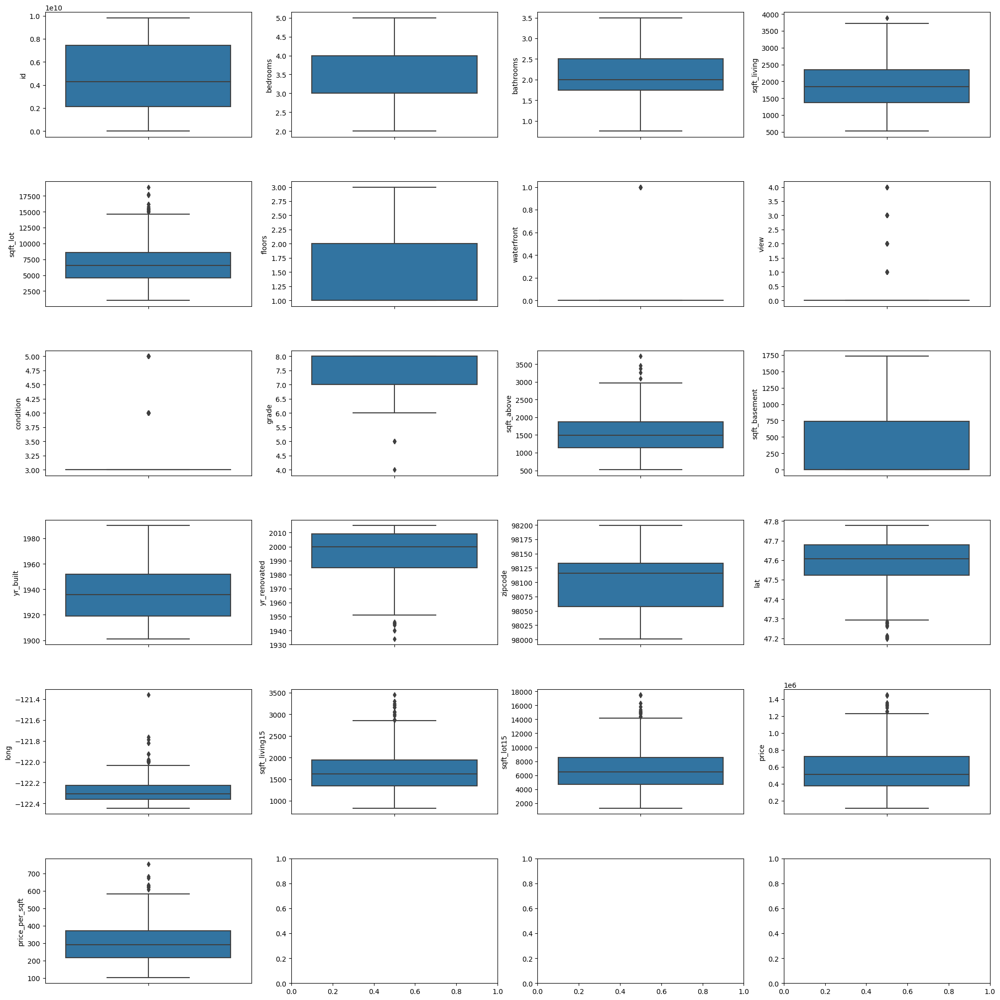

In [24]:
# Reduced Data Set Check
fig, axs = plt.subplots(ncols=4, nrows=6, figsize=(20,20))
index = 0
axs = axs.flatten()
for k,v in filtered_df_ren.items():
    if k!="date":
        sns.boxplot(y=k, data=filtered_df_ren, ax=axs[index])
        index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

<Axes: >

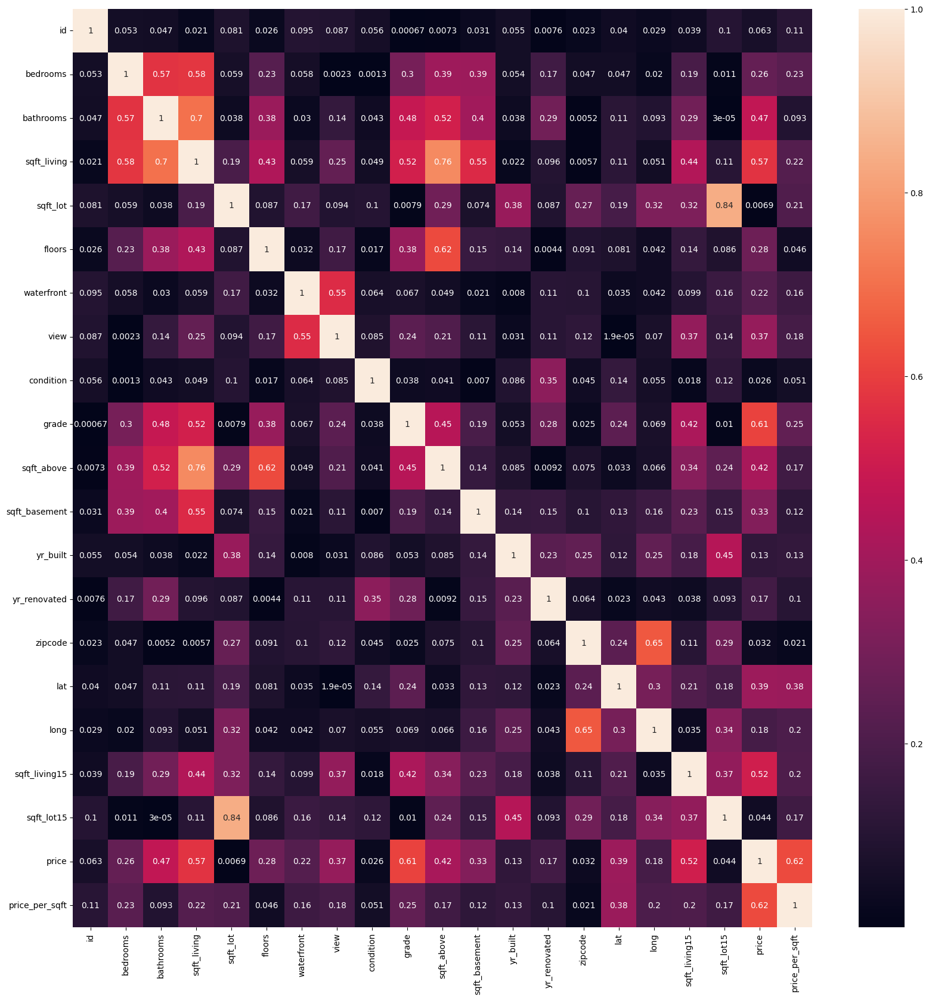

In [22]:
# Corr Matrix  for the filtered data- living space and grade shows high correlation with price - plot again after cleaning
plt.figure(figsize=(20, 20))
sns.heatmap(filtered_df_ren.corr().abs(),  annot=True)

# Estimate the yr_renovation for the data_set

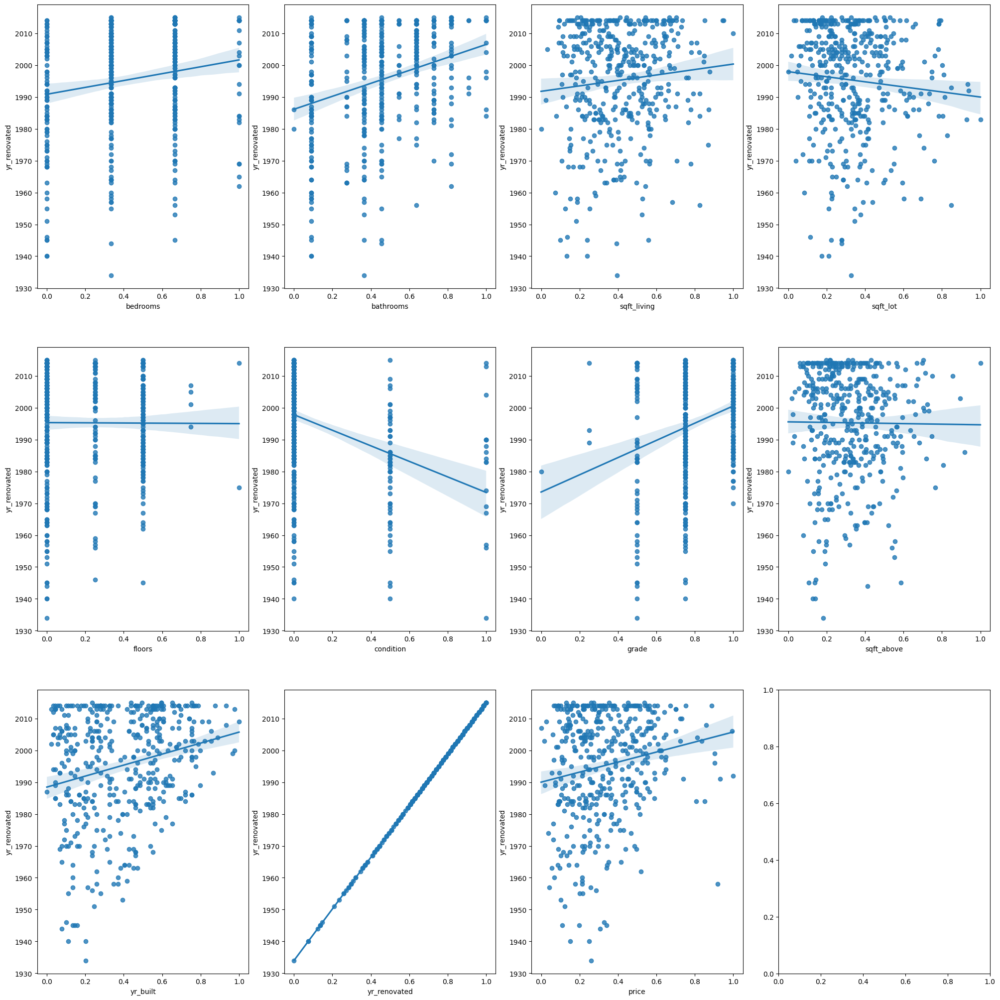

In [28]:
# Regression plot
# Scaling the columns 
min_max_scaler = preprocessing.MinMaxScaler()
columns = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'condition','grade','sqft_above', 'yr_built','yr_renovated','price']
x = filtered_df_ren.loc[:,columns]
y = filtered_df_ren['yr_renovated']
x = pd.DataFrame(data=min_max_scaler.fit_transform(x), columns=columns)
fig, axs = plt.subplots(ncols=4, nrows=3, figsize=(20, 20))
index = 0
axs = axs.flatten()
for i, k in enumerate(columns):
    if i!="date":
        sns.regplot(y=y, x=x[k], ax=axs[i])
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

# 2.0 Identifying poor neighborhoods: Exluding outliers, droping yr_renovated

In [30]:
filtered_df['price_per_sqft'] = filtered_df['price'] / filtered_df['sqft_living']

# Set initial center coordinates and zoom level
initial_center = {"lat": filtered_df["lat"].mean(), "lon": filtered_df["long"].mean()}
initial_zoom = 10  # Adjust the zoom level as needed

# Define the grid dimensions (number of bins)
num_bins_x = 200
num_bins_y = 200


# Calculate bin edges
x_edges = np.linspace(filtered_df["long"].min(), filtered_df["long"].max(), num_bins_x + 1)
y_edges = np.linspace(filtered_df["lat"].min(), filtered_df["lat"].max(), num_bins_y + 1)

# Use numpy.digitize to assign data points to bins
x_bin_indices = np.digitize(filtered_df["long"], x_edges) - 1
y_bin_indices = np.digitize(filtered_df["lat"], y_edges) - 1

# Aggregate data into rectangular bins
bin_avg_grades = np.zeros((num_bins_y, num_bins_x))

# Calculate average grades for each bin
for i in range(num_bins_y):
    for j in range(num_bins_x):
        mask = (x_bin_indices == j) & (y_bin_indices == i)
        if np.any(mask):
            bin_avg_grades[i, j] = np.mean(filtered_df.loc[mask, "price_per_sqft"])

# Define a color scale with transparency
colorscale = [
    [0, "rgba(0, 0, 0, 0)"],  # Transparent
    [0.2, "rgb(0, 92, 175)"],  # Blue
    [0.4, "rgb(0, 158, 115)"],  # Green
    [0.6, "rgb(254, 190, 60)"],  # Yellow
    [1.0, "rgb(213, 94, 0)"]  # Orange
]
# Create a heatmap-like representation using go.Heatmap
heatmap = go.Heatmap(
    z=bin_avg_grades,
    x=(x_edges[:-1] + x_edges[1:]) / 2,
    y=(y_edges[:-1] + y_edges[1:]) / 2,
    colorscale=colorscale,  # Choose a colorscale
    showscale=True  # Show the color scale legend
)

fig = go.Figure(heatmap)

# fig = px.scatter_geo(df_kch,
#                      lat="lat", lon="long",
#                      text="grade",
#                      color_discrete_sequence=["tomato"],
#                      size_max=5)#,
#                     #  center=initial_center,
#                     #  scope="north america",  # Adjust the scope as needed
#                     #  projection_scale=10)# Adjust the size of the markers


# Update the figure layout to set focus and zoom
fig.update_geos(
    projection_type="albers usa",  # Set the projection type
    center={"lat": initial_center["lat"], "lon": initial_center["lon"]},  # Center on the initial center
    visible=False,  # Hide the default world map
    showland=True,  # Show land outlines
    projection_scale=0
)
fig.update_layout(
    width=1000,  # Set the width of the figure
    height=600  # Set the height of the figure
)

fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0}  # Adjust margins to reduce white space
)

# Show the plot
fig.show()

In [38]:
min_price_bin = None
max_difference_bin = None
max_difference = -np.inf  # Initialize with negative infinity

neighbor_radius = 10  # Adjust this radius as needed

for i in range(neighbor_radius, num_bins_y - neighbor_radius -1):
    for j in range(neighbor_radius, num_bins_x - neighbor_radius -1):
        central_value = bin_avg_grades[i, j]
        
        # Calculate the average of the values of neighbors within the specified radius
        neighbor_values = []
        for row in range(i - neighbor_radius, i + neighbor_radius + 1):
            for col in range(j - neighbor_radius, j + neighbor_radius + 1):
                neighbor_values.append(bin_avg_grades[row, col])
        
        average_neighbor_value = np.mean(neighbor_values)
        neighbor_difference = average_neighbor_value - central_value 
        
        if central_value > 0 and neighbor_difference > max_difference:
            max_difference = neighbor_difference
            max_difference_bin = (i, j)
            
            if min_price_bin is None or central_value < bin_avg_grades[min_price_bin]:
                min_price_bin = (i, j)

print("Bin with lowest price_per_sqft and highest difference to neighbors:", min_price_bin)
# Define the row and column indices of the bin
row_index = min_price_bin[0]  # Replace with the actual row index you have
col_index = min_price_bin[1]  # Replace with the actual column index you have

# Calculate the latitude and longitude based on the bin indices
target_latitude = (y_edges[row_index] + y_edges[row_index + 1]) / 2
target_longitude = (x_edges[col_index] + x_edges[col_index + 1]) / 2

print("Latitude:", target_latitude)
print("Longitude:", target_longitude)

Bin with lowest price_per_sqft and highest difference to neighbors: (46, 37)
Latitude: 47.30044525
Longitude: -122.281


In [40]:
# Profibility rate
# Create a new variable to store profitability rates
profitability_rates = np.zeros((num_bins_y, num_bins_x))

for i in range(neighbor_radius, num_bins_y - neighbor_radius - 1):
    for j in range(neighbor_radius, num_bins_x - neighbor_radius - 1):
        central_value = bin_avg_grades[i, j]
        
        # Calculate the average of the values of neighbors within the specified radius
        neighbor_values = []
        for row in range(i - neighbor_radius, i + neighbor_radius + 1):
            for col in range(j - neighbor_radius, j + neighbor_radius + 1):
                neighbor_values.append(bin_avg_grades[row, col])
        
        average_neighbor_value = np.mean(neighbor_values)
        
        if central_value > 0:
            profitability_rate = average_neighbor_value / central_value
            profitability_rates[i, j] = profitability_rate

heatmap = go.Heatmap(
    z=profitability_rates,
    x=(x_edges[:-1] + x_edges[1:]) / 2,
    y=(y_edges[:-1] + y_edges[1:]) / 2,
    colorscale=colorscale,  # Choose a colorscale
    showscale=True  # Show the color scale legend
)


fig = go.Figure(heatmap)


# Update the figure layout to set focus and zoom
fig.update_geos(
    projection_type="albers usa",  # Set the projection type
    center={"lat": initial_center["lat"], "lon": initial_center["lon"]},  # Center on the initial center
    visible=False,  # Hide the default world map
    showland=True,  # Show land outlines
    projection_scale=0
)
fig.update_layout(
    width=1000,  # Set the width of the figure
    height=600  # Set the height of the figure
)

fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0}  # Adjust margins to reduce white space
)

# Show the plot
fig.show()

In [47]:
# Calculate the indices that would sort the profitability_rates array in descending order
sorted_indices = np.argsort(-profitability_rates, axis=None)

# Get the top ten indices
top_ten_indices = sorted_indices[:10]

# Convert the top ten indices back to coordinates
top_ten_coords = [np.unravel_index(index, profitability_rates.shape) for index in top_ten_indices]

# Print the coordinates of the top ten bins
print("Top ten bins with the highest profitability rates:")
for coord in top_ten_coords:
    row_index, col_index = coord
    
    # Calculate the latitude and longitude based on the bin indices
    target_latitude = (y_edges[row_index] + y_edges[row_index + 1]) / 2
    target_longitude = (x_edges[col_index] + x_edges[col_index + 1]) / 2
    
    print("Latitude:", target_latitude)
    print("Longitude:", target_longitude)

Top ten bins with the highest profitability rates:
Latitude: 47.67657375
Longitude: -122.34612
Latitude: 47.72320125
Longitude: -122.3106
Latitude: 47.67346525
Longitude: -122.34612
Latitude: 47.524257250000005
Longitude: -122.33428
Latitude: 47.69522475
Longitude: -122.32836
Latitude: 47.524257250000005
Longitude: -122.32244
Latitude: 47.524257250000005
Longitude: -122.32836
Latitude: 47.52114875
Longitude: -122.3402
Latitude: 47.542908249999996
Longitude: -122.32244
Latitude: 47.53979975
Longitude: -122.35796


In [48]:
# Initialize variables to store the coordinates of the highest profitability rate
highest_profitability_coords = None
highest_profitability_rate = -np.inf

# Iterate through all bin indices and find the highest profitability rate
for i in range(num_bins_y):
    for j in range(num_bins_x):
        profitability_rate = profitability_rates[i, j]
        
        if profitability_rate > highest_profitability_rate:
            highest_profitability_rate = profitability_rate
            highest_profitability_coords = (i, j)

# Convert the coordinates back to latitude and longitude
if highest_profitability_coords is not None:
    row_index, col_index = highest_profitability_coords
    target_latitude = (y_edges[row_index] + y_edges[row_index + 1]) / 2
    target_longitude = (x_edges[col_index] + x_edges[col_index + 1]) / 2

    print("Coordinates of highest profitability rate:")
    print("Latitude:", target_latitude)
    print("Longitude:", target_longitude)
else:
    print("No bins with positive profitability rates found.")

Coordinates of highest profitability rate:
Latitude: 47.67657375
Longitude: -122.34612


In [49]:
# Calculate distances
df_kch['distance'] = df_kch.apply(lambda row: geodesic((row['lat'], row['long']), (target_latitude, target_longitude)).kilometers, axis=1)

# Sort by distance and then by price
df_kch_sorted = df_kch.sort_values(by=['distance', 'price']).reset_index(drop=True)

# Filter the top three cheapest houses
top_3_cheapest = df_kch_sorted.head(10)

# Display the result
top_3_cheapest

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,distance
0,9523102040,3.0,1.50,2260.0,5300.0,1.0,0.0,0.0,3,7,...,1940,0.0,98103,47.6756,-122.348,1950.0,5000.0,2014-09-22,440000.0,0.177907
1,1814800060,4.0,3.50,3290.0,5559.0,1.5,NaN,0.0,3,8,...,1906,2004.0,98103,47.6788,-122.346,1790.0,6000.0,2015-02-20,965000.0,0.247687
2,2331300395,4.0,2.00,2520.0,6000.0,1.0,0.0,0.0,3,8,...,1921,2007.0,98103,47.6767,-122.350,1580.0,3720.0,2014-05-10,875000.0,0.291689
3,2331300415,3.0,2.25,2140.0,3000.0,2.0,0.0,0.0,3,9,...,1905,NaN,98103,47.6767,-122.351,1430.0,4712.0,2014-06-20,780000.0,0.366710
4,3362401935,4.0,1.75,1290.0,3060.0,2.0,0.0,0.0,4,7,...,1906,0.0,98103,47.6798,-122.348,1510.0,4080.0,2014-06-19,549000.0,0.385485
5,9523103001,2.0,1.00,850.0,3276.0,1.0,0.0,0.0,3,6,...,1910,0.0,98103,47.6742,-122.350,1460.0,4100.0,2014-10-13,389000.0,0.393122
6,3362401761,2.0,1.50,1020.0,1049.0,3.0,0.0,0.0,3,8,...,2008,0.0,98103,47.6800,-122.348,1350.0,1395.0,2015-02-25,450000.0,0.406259
7,9523103000,3.0,1.75,2430.0,4524.0,1.5,NaN,0.0,4,7,...,1924,0.0,98103,47.6740,-122.350,1610.0,4100.0,2014-10-20,780000.0,0.408384
8,3362401763,2.0,1.50,1020.0,1060.0,3.0,0.0,0.0,3,8,...,2008,0.0,98103,47.6801,-122.348,1340.0,1415.0,2014-05-08,441750.0,0.416702
9,3362401758,3.0,2.25,1420.0,990.0,3.0,0.0,0.0,3,8,...,2008,0.0,98103,47.6801,-122.348,1350.0,1415.0,2014-09-03,467000.0,0.416702


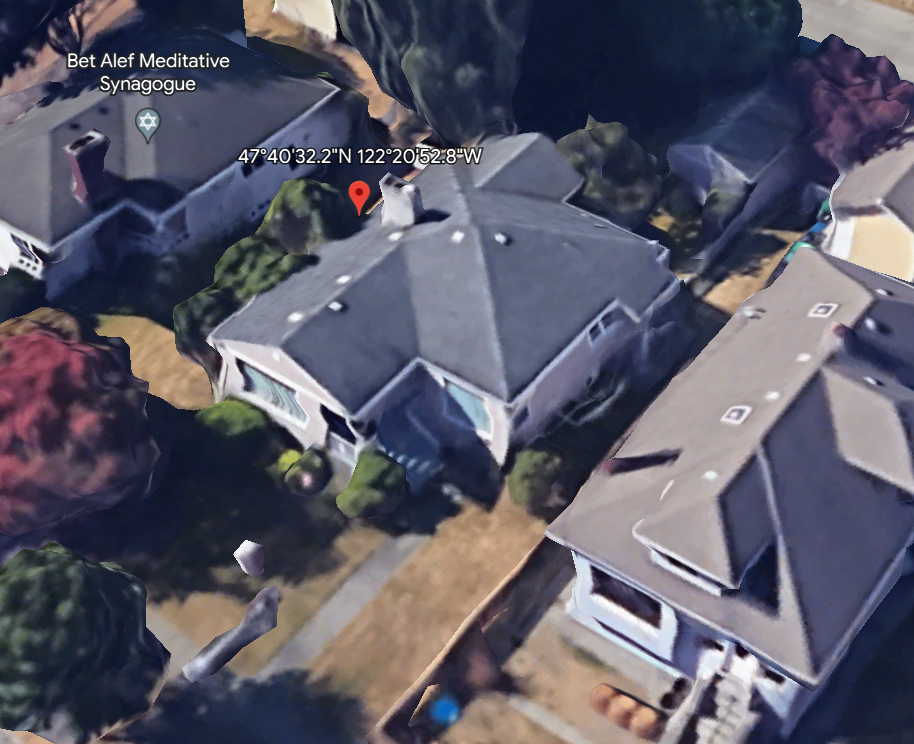

In [45]:
top_ten_coords

(array([167, 182, 166, 118, 173, 118, 118, 117, 124, 123]),
 array([26, 32, 26, 28, 29, 30, 29, 27, 30, 24]))

In [35]:
# Calculate distances
df_kch['distance'] = df_kch.apply(lambda row: geodesic((row['lat'], row['long']), (target_latitude, target_longitude)).kilometers, axis=1)

# Sort by distance and then by price
df_kch_sorted = df_kch.sort_values(by=['distance', 'price']).reset_index(drop=True)

# Filter the top three cheapest houses
top_3_cheapest = df_kch_sorted.head(10)

# Display the result
top_3_cheapest

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,distance
0,6181430280,5.0,2.5,3597.0,4972.0,2.0,0.0,0.0,3,7,...,2006,NaN,98001,47.3002,-122.282,3193.0,6000.0,2014-09-15,330000.0,0.080394
1,6181430800,4.0,2.5,3504.0,6000.0,2.0,0.0,0.0,3,7,...,2006,0.0,98001,47.3012,-122.285,2790.0,5231.0,2015-01-05,330000.0,0.313934
2,6181400920,3.0,2.5,1830.0,4997.0,2.0,0.0,0.0,3,7,...,2004,0.0,98001,47.3035,-122.283,2488.0,4998.0,2015-04-30,286651.0,0.371776
3,6181400470,4.0,2.5,2130.0,4496.0,2.0,0.0,0.0,3,7,...,2004,0.0,98001,47.3041,-122.280,3220.0,5400.0,2015-01-27,215000.0,0.413301
4,6181410950,3.0,2.5,1794.0,4769.0,2.0,0.0,0.0,3,7,...,2005,0.0,98001,47.3052,-122.283,3557.0,4807.0,2014-09-22,254950.0,0.549830
5,4031000460,3.0,1.0,920.0,9812.0,1.0,0.0,0.0,4,7,...,1962,0.0,98001,47.2958,-122.284,1188.0,9812.0,2014-06-10,199500.0,0.564088
6,4031000250,3.0,1.0,1310.0,9612.0,1.0,0.0,0.0,3,7,...,1962,0.0,98001,47.2958,-122.285,1310.0,9812.0,2014-06-26,150000.0,0.598529
7,6181420200,4.0,2.5,2789.0,3960.0,2.0,0.0,0.0,3,7,...,2007,NaN,98001,47.3059,-122.280,2547.0,3960.0,2014-11-20,272000.0,0.611138
8,4031000260,2.0,1.0,1730.0,9610.0,1.0,NaN,0.0,3,7,...,1962,0.0,98001,47.2956,-122.285,1310.0,9812.0,2014-06-06,200000.0,0.617817
9,4031000520,1.0,2.0,1150.0,9812.0,1.0,0.0,0.0,4,7,...,1962,0.0,98001,47.2951,-122.284,1200.0,9812.0,2014-07-08,115000.0,0.636110


In [17]:
# Load the GeoJSON data using geopandas
# web page: https://gis-kingcounty.opendata.arcgis.com/datasets/kingcounty::metropolitan-king-county-council-kccdst-area/explore?location=47.521009%2C-121.704444%2C8.98
# following contains nice example: https://github.com/altair-viz/altair/issues/588


# importing this allows to access the properties for the plot
# with open("data/Metropolitan_King_County_Council___kccdst_area.geojson") as f:
with open("data/Cities_and_Unincorporated_King_County___city_kc_area.geojson") as f:
    geojson_data = json.load(f)
geoData = alt.Data(values=geojson_data['features'])